# Landing on the Moon using REINFORCE

## Introduction

### Description

Traditionally, reinforcement learning has operated on "tabular" state spaces, e.g. "State 1", "State 2", "State 3" etc. However, many important and interesting reinforcement learning problems (like moving robot arms or playing Atari games) are based on either continuous or very high-dimensional state spaces (like robot joint angles or pixels). Deep neural networks constitute one method for learning a value function or policy from continuous and high-dimensional observations. 

In this miniproject, you will teach an agent to play the Lunar Lander game from [OpenAI Gym](https://gym.openai.com/envs/LunarLander-v2/). The agent needs to learn how to land a lunar module safely on the surface of the moon. The state space is 8-dimensional and (mostly) continuous, consisting of the X and Y coordinates, the X and Y velocity, the angle, and the angular velocity of the lander, and two booleans indicating whether the left and right leg of the lander have landed on the moon.

The agent gets a reward of +100 for landing safely and -100 for crashing. In addition, it receives "shaping" rewards at every step. It receives positive rewards for moving closer to [0,0], decreasing in velocity, shifting to an upright angle and touching the lander legs on the moon. It receives negative rewards for moving away from the landing site, increasing in velocity, turning sideways, taking the lander legs off the moon and for using fuel (firing the thrusters). The best score an agent can achieve in an episode is about +250.

There are two versions of the task: one with discrete controls and one with continuous controls but we'll only work with the discrete version. In the discrete version, the agent can take one of four actions at each time step: [do nothing, fire engines left, fire engines right, fire engines down]. 

We will use Policy Gradient approaches (using the REINFORCE rule) to learn the task. As you remember, in standard supervised learning tasks (e.g. image classification), the network generates a probability distribution over the outputs, and is trained to maximize the probability of a specific target output given an observation (input). In Policy Gradient methods, the network generates a probability distribution over actions, and is trained to maximize expected future rewards given an observation.

## Dependencies Setup
Please run the following cell to install the required packages. Note that you may be asked to restart the notebook. After restarting and reruning the cells, everything should work.

In [ ]:
#remove " > /dev/null 2>&1" to see what is going on under the hood
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1
!pip3 install box2d-py > /dev/null 2>&1
!pip3 install gym[Box_2D] pyvirtualdisplay > /dev/null 2>&1

!apt-get update > /dev/null 2>&1
!apt-get install cmake > /dev/null 2>&1
!pip install --upgrade setuptools 2>&1
!pip install ez_setup > /dev/null 2>&1

Requirement already up-to-date: setuptools in /usr/local/lib/python3.7/dist-packages (57.0.0)


In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Setup

### Dependencies and constants

In [ ]:
import gym
from gym import logger as gymlogger
from gym.wrappers import Monitor
gymlogger.set_level(40) #error only
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline
import math
import glob
import logging
import io
import base64

from IPython import display as ipythondisplay
from IPython.display import HTML, clear_output

from matplotlib.animation import FuncAnimation
from pyvirtualdisplay import Display
from gym.envs.box2d.lunar_lander import heuristic
display = Display(visible=0, size=(1400, 900))
display.start()

In [ ]:
import keras
import tensorflow as tf
# from tensorflow_probability.distributions import Beta
from keras.models import Sequential
from keras.layers import Dense, Lambda
from keras.optimizers import Adam
from keras import backend as K

# set the seed
sciper = {'student_1': 321957, # Riccardo Cadei
          'student_2': 321215  # Niccolò Polvani} 
seed = sciper['student_1']+sciper['student_2']

np.random.seed(seed)
tf.random.set_seed(seed*2)

### Gym Setup

Here we load the Reinforcement Learning environments from Gym.

We limit each episode to 500 steps so that we can train faster. 

In [ ]:
gym.logger.setLevel(logging.ERROR)
discrete_env = gym.make('LunarLander-v2')
discrete_env._max_episode_steps = 500
discrete_env.seed(seed*3)
gym.logger.setLevel(logging.WARN)

%matplotlib inline
plt.rcParams['figure.figsize'] = 12, 8
plt.rcParams["animation.html"] = "jshtml"

### Utilities

We include a function that lets you visualize an "episode" (i.e. a series of observations resulting from the actions that the agent took in the environment).

As well, we will use the `Results` class (a wrapper around a python dictionary) to store, save, load and plot your results. You can save your results to disk with `results.save('filename')` and reload them with `Results(filename='filename')`. Use `results.pop(experiment_name)` to delete an old experiment.

In [ ]:
def AddValue(output_size, value):
    return Lambda(lambda x: x + value, output_shape=(output_size,))

def render(episode, env):
    
    fig = plt.figure()
    img = plt.imshow(env.render(mode='rgb_array'))
    plt.axis('off')

    def animate(i):
        img.set_data(episode[i])
        return img,

    anim = FuncAnimation(fig, animate, frames=len(episode), interval=24, blit=True)
    html = HTML(anim.to_jshtml())
    
    plt.close(fig)
    !rm None0000000.png
    
    return html

class Results(dict):
    
    def __init__(self, *args, **kwargs):
        if 'filename' in kwargs:
            data = np.load(kwargs['filename'])
            super().__init__(data)
        else:
            super().__init__(*args, **kwargs)
        self.new_key = None
        self.plot_keys = None
        self.ylim = None
        
    def __setitem__(self, key, value):
        super().__setitem__(key, value)
        self.new_key = key

    def plot(self, window):
        clear_output(wait=True)
        for key in self:
            #Ensure latest results are plotted on top
            if self.plot_keys is not None and key not in self.plot_keys:
                continue
            elif key == self.new_key:
                continue
            self.plot_smooth(key, window)
        if self.new_key is not None:
            self.plot_smooth(self.new_key, window)
        plt.xlabel('Episode')
        plt.ylabel('Reward')
        plt.legend(loc='lower right')
        if self.ylim is not None:
            plt.ylim(self.ylim)
        plt.show()
        
    def plot_smooth(self, key, window):
        if len(self[key]) == 0:
            plt.plot([], [], label=key)
            return None
        y = np.convolve(self[key], np.ones((window,))/window, mode='valid')
        x = np.linspace(window/2, len(self[key]) - window/2, len(y))
        plt.plot(x, y, label=key)
        
    def save(self, filename='results'):
        np.savez(filename, **self)

### Test runs

To get an idea of how the environment works, we'll plot an episode resulting from random actions at each point in time, and a "perfect" episode using a specially-designed function to land safely within the yellow flags. 

In [ ]:
def run_fixed_episode(env, policy):
    frames = []
    observation = env.reset()
    done = False
    while not done:
        frames.append(env.render(mode='rgb_array'))
        action = policy(env, observation)
        observation, reward, done, info = env.step(action)
    return frames
    
def random_policy(env, observation):
    return env.action_space.sample()

def heuristic_policy(env, observation):
    return heuristic(env.unwrapped, observation)

In [ ]:
episode = run_fixed_episode(discrete_env, random_policy)
render(episode, discrete_env)

rm: cannot remove 'None0000000.png': No such file or directory


In [ ]:
episode = run_fixed_episode(discrete_env, heuristic_policy)
render(episode, discrete_env)

rm: cannot remove 'None0000000.png': No such file or directory


## Experiment Loop

In [ ]:
num_episodes = 3000

def run_experiment(experiment_name, 
                   env, 
                   num_episodes, 
                   policy_learning_rate=0.001, 
                   value_learning_rate=0.001, 
                   baseline=None, 
                   num_layers=3):

    #Initiate the learning agent
    agent = RLAgent(n_obs=env.observation_space.shape[0], 
                    action_space=env.action_space,
                    policy_learning_rate=policy_learning_rate, 
                    value_learning_rate=value_learning_rate, 
                    discount=0.99, 
                    baseline=baseline, 
                    num_layers=num_layers)

    rewards = []
    all_episode_frames = []
    step = 0
    for episode in range(1, num_episodes+1):
    
        #Update results plot and occasionally store an episode movie
        episode_frames = None
        if episode % 10 == 0:
            results[experiment_name] = np.array(rewards)
            results.plot(10)
        if episode % 500 == 0:
            episode_frames = []
            
        #Reset the environment to a new episode
        observation = env.reset()
        episode_reward = 0

        while True:
        
            if episode_frames is not None:
                episode_frames.append(env.render(mode='rgb_array'))

            # 1. Decide on an action based on the observations
            action = agent.decide(observation)

            # 2. Take action in the environment
            next_observation, reward, done, info = env.step(action)
            episode_reward += reward

            # 3. Store the information returned from the environment for training
            agent.observe(observation, action, reward)

            # 4. When we reach a terminal state ("done"), use the observed episode to train the network
            if done:
                rewards.append(episode_reward)
                if episode_frames is not None:
                    all_episode_frames.append(episode_frames)
                agent.train()
                break

            # Reset for next step
            observation = next_observation
            step += 1
            
    return all_episode_frames, agent

## The Agent


In [ ]:
class RLAgent(object):
    
    def __init__(self, n_obs, action_space, policy_learning_rate, value_learning_rate, 
                 discount, baseline = None, num_layers=3, ma_window_size=50):

        # input/output
        self.n_obs = n_obs  
        self.n_act = action_space.n
        
        # training parameters
        self.plr = policy_learning_rate
        self.vlr = value_learning_rate
        self.gamma = discount
        self.num_layers = num_layers
        self.ma_window_size = ma_window_size
    
        
        # lists to store the cumulative observations for an episode
        self.episode_observations, self.episode_actions, self.episode_rewards = [], [], []

        # set baseline
        self.use_simple_baseline = False
        self.use_adaptive_baseline = False

        if baseline == 'simple':
            self.use_simple_baseline = True
        elif baseline == 'adaptive':
            self.use_adaptive_baseline = True

        # build the keras network/s
        self._build_network()
        

    def observe(self, state, action, reward):
        """ This function takes the observations the agent received from the environment and stores them
            in the lists above."""

        self.episode_observations.append(state)
        self.episode_actions.append(action)
        self.episode_rewards.append(reward)
        
    def decide(self, state):
        """ This function feeds the observed state to the network, which returns a distribution
            over possible actions. Sample an action from the distribution and return it."""

        # get actions probabilities
        state = state.reshape([1, self.n_obs])
        action_probabilities = self.model(state).numpy().flatten()
        # sample an action
        action = np.random.choice(self.n_act, p=action_probabilities)

        return action

    def train(self):
        """ When this function is called, the accumulated episode observations, actions and discounted rewards
            should be fed into the network and used for training. Use the _get_returns function to first turn 
            the episode rewards into discounted returns. 
            Apply simple or adaptive baselines if needed, depending on parameters."""

        episode_length = len(self.episode_observations)

        # States
        states=np.array(self.episode_observations)

        # Actions (hot encoding)
        mask = np.eye(self.n_act)
        actions = mask[self.episode_actions]

        # Discounted Rewards
        discounted_rewards = np.array(self._get_returns())

        # update model_baseline parameters
        if self.use_adaptive_baseline:
            self.model_baseline.train_on_batch(x = states,
                                               y = discounted_rewards)

        # subtract Baseline
        if self.use_simple_baseline:
            if self.ma_window_size < episode_length:
              for i in range(episode_length):
                    l = max(0, i - self.ma_window_size)
                    u = min(episode_length, i + self.ma_window_size)
                    discounted_rewards[i] -= np.mean(discounted_rewards[l:u])
              else:
                 discounted_rewards = np.array(discounted_rewards) - np.mean(discounted_rewards) 
        elif self.use_adaptive_baseline:
            discounted_rewards -= self.model_baseline(states).numpy().flatten()
        
        # update model (policy) parameters
        self.model.train_on_batch(x = states, 
                                  y = actions,
                                  sample_weight = discounted_rewards)
        
        # reset cumulative lists
        self.episode_observations, self.episode_actions, self.episode_rewards = [], [], []


    def _get_returns(self):
        """ This function should process self.episode_rewards and return the discounted episode returns
            at each step in the episode. """ 
               
        discounted_rewards = []
        cumulative_total_return = 0
        for reward in self.episode_rewards[::-1]:      
           cumulative_total_return = (cumulative_total_return*self.gamma) + reward
           discounted_rewards.insert(0, cumulative_total_return) 
    
        return discounted_rewards


    def _build_network(self):
        """ This function should build the network that can then be called by decide and train. 
            The network takes observations as inputs and has a policy distribution as output."""

        model = Sequential()
        for i in range(self.num_layers):
            model.add(Dense(16, activation="relu"))
        model.add(Dense(self.n_act, activation="softmax")) 
        
        model.compile(loss = "categorical_crossentropy", optimizer = Adam(lr=self.plr))
        self.model = model

        if self.use_adaptive_baseline:
            model_baseline = Sequential()
            for i in range(self.num_layers):
                  model_baseline.add(Dense(16, activation="relu"))
            model_baseline.add(Dense(1)) 
        
            model_baseline.compile(loss = "mse", optimizer = Adam(lr=self.vlr))
            self.model_baseline = model_baseline

## Experimental Tests



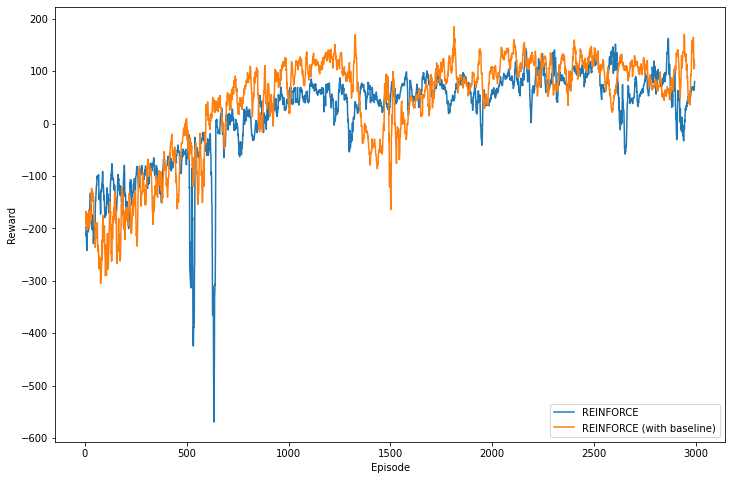

In [ ]:
results = Results()
policy_learning_rate = 0.0025

# REINFORCE
episodes, model = run_experiment("REINFORCE", discrete_env, num_episodes, policy_learning_rate)

# REINFORCE + Simple Baseline
episodes, baseline_model = run_experiment("REINFORCE (with baseline)", discrete_env, num_episodes, policy_learning_rate, baseline='simple')

In [ ]:
# plot last episode
render(episodes[-1], discrete_env)

rm: cannot remove 'None0000000.png': No such file or directory


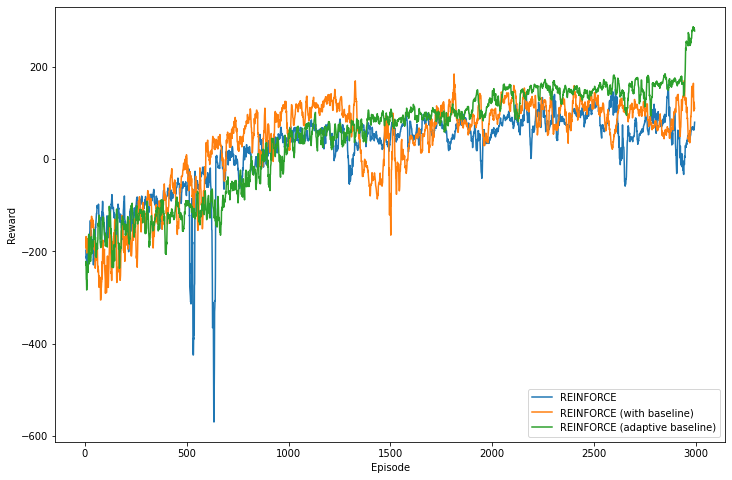

In [ ]:
policy_learning_rate = 0.0025
value_learning_rate = 0.005

# REINFORCE + Adaptive Baseline
episodes, d_model = run_experiment("REINFORCE (adaptive baseline)", discrete_env, num_episodes, policy_learning_rate, 
                                   value_learning_rate, baseline='adaptive')

In [ ]:
# plot last episode
render(episodes[-1], discrete_env)

rm: cannot remove 'None0000000.png': No such file or directory


## Visualizing the Value Function


In [ ]:
tf.keras.models.save_model(d_model.model_baseline, "value_network.h5")

In [ ]:
value_network = tf.keras.models.load_model("value_network.h5")
value_network.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 16)                144       
_________________________________________________________________
dense_13 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_14 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 17        
Total params: 705
Trainable params: 705
Non-trainable params: 0
_________________________________________________________________


In [ ]:
import matplotlib

def get_network_preds(model, x_lim: tuple, y_lim: tuple,
                       vel_x, vel_y, angle, ang_vel, contact_l, contact_r):
  
  """
  state = [position_x, position_y, velocity_x, velocity_y, 
                    angle, angular_velocity, contact_left, contact_right]
  """


  num_states = 500  # number of states observed in the x and y direction
  positions_x = np.linspace(x_lim[0], x_lim[1], num=num_states)
  positions_y = np.linspace(y_lim[0], y_lim[1], num=num_states)

  img = np.zeros((num_states, num_states)) # contains value predicted by the network
                                         # img[0, 0] corresponds to coordinates
                                         # (x_lim[0], y_lim[1])

  # build image from the bottom, going up
  for i in range(num_states):
    pos_y = positions_y[i]

    states = np.zeros((num_states, 8))
    states[:, 0] = positions_x
    states[:, 1] = pos_y 
    states[:, 2] = vel_x
    states[:, 3] = vel_y
    states[:, 4] = angle
    states[:, 5] = ang_vel
    states[:, 6] = contact_l
    states[:, 7] = contact_r

    preds = model(states).numpy().flatten()
    img[num_states - (i+ 1), :] = preds

  title = "[{:.2f}, {:.2f}, {:.2f}, {:.2f}, {:d}, {:d}]".format(
      vel_x, vel_y, angle, ang_vel, int(contact_l), int(contact_r))
  
  return img, title


    
def plot_network_preds(model):
  img1, title1 = get_network_preds(model,(-1, 1), (-0.2 , 1), 0, -0.2, 0, 0, 0, 0)
  title1 = "Vertical descent\n" + title1
  img2, title2 = get_network_preds(model, (-1, 1), (-0.2 , 1), 0, 0, 0, 0, 0, 0)
  title2 = "Static\n" + title2
  img3, title3 = get_network_preds(model, (-1, 1), (-0.2 , 1), 1, 0, np.pi/4, 0, 0, 0)
  title3 = "Inclined shift to the right\n" + title3
  img4, title4 = get_network_preds(model, (-1, 1), (-0.2 , 1), 0, 0, 0, 0, 1, 1)
  title4 = "Both legs touch the ground\n" + title4
  img5, title5 = get_network_preds(model, (-1, 1), (-0.2 , 1), 0, 1, 0, 27, 0, 0)
  title5 = "Angular velocity out of range\n" + title5
  img6, title6 = get_network_preds(model, (-1, 1), (-0.2 , 1), 0, -18, np.pi, 0, 1, 0)
  title6 = "Vertical Speed out of range\n" + title6

  images = [img1, img2, img3, img4, img5, img6]
  titles = [title1, title2, title3, title4, title5, title6]
  #for img in images:
  #  print("min:", np.min(img), "max:", np.max(img))
  
  fig, axs = plt.subplots(3, 2, figsize=(18, 12))

  fig.tight_layout(pad=5)

  for img, title, ax in zip(images, titles, axs.ravel()):
    vmin = 30
    vmax = 100
    #img = np.clip(img, vmin, vmax)
    im = ax.imshow(img)
    ax.set_title(title)
    im.set_clim(vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=ax)
    ax.set_xticks([0, 125, 250, 375, 500])
    ax.set_xticklabels(np.linspace(-1, 1, 5))
    ax.set_xlabel("x")

    ax.set_yticks(np.linspace(0, 500, 7))
    ax.set_yticklabels([1, 0.8, 0.6, 0.4, 0.2, 0, -0.2])
    ax.set_ylabel("y")
 
  plt.show()

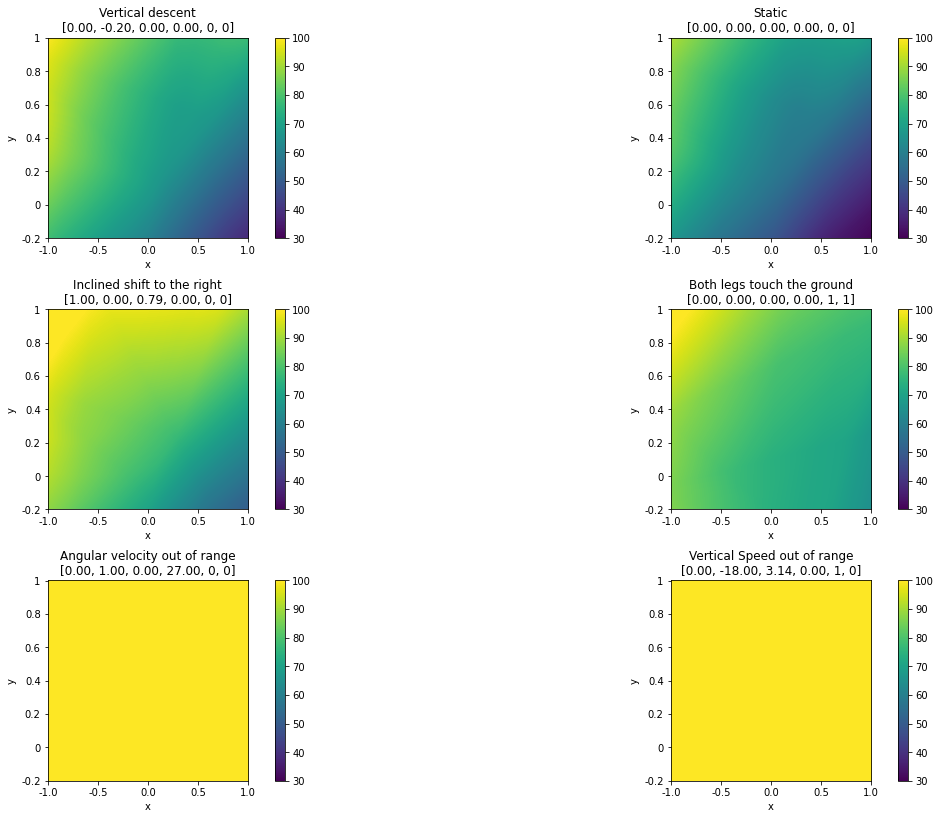

In [ ]:
plot_network_preds(value_network)

## Comparing Architectures


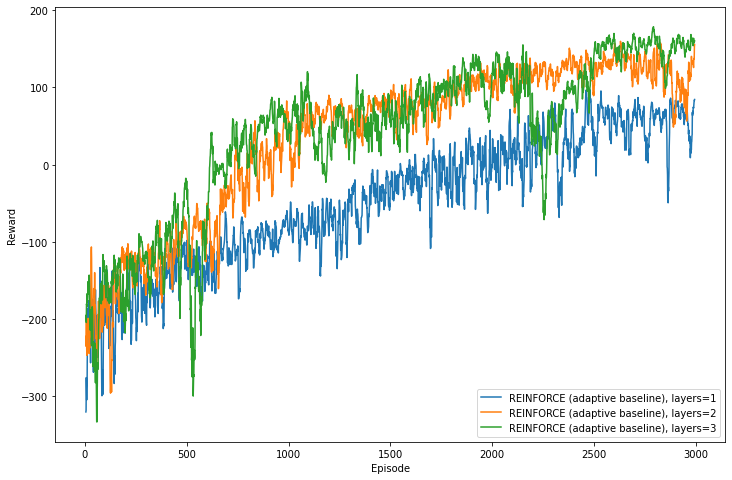

In [ ]:
results = Results()
policy_learning_rate = 0.0025
value_learning_rate = 0.005

for i in range(1, 4):
  episodes, d_model = run_experiment("REINFORCE (adaptive baseline), layers=" + str(i), discrete_env, num_episodes, policy_learning_rate, 
                                   value_learning_rate, baseline='adaptive', num_layers = i)